In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import os
import datetime
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pylab as plt

# Data Cleaning and Exploratory Data Analysis¶

In [2]:
nypd = pd.read_csv("NYPD_Arrest_Data__Year_to_Date_.csv",index_col='ARREST_KEY')

In [3]:
nypd=nypd.dropna()
nypd['ARREST_DATE1'] = nypd['ARREST_DATE'].apply(lambda x:datetime.datetime.strptime(x,'%m/%d/%Y'))

In [4]:
nypd

,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,New Georeferenced Column,ARREST_DATE1
ARREST_KEY,,,,,,,,,,,,,,,,,,,
238013474,12/18/2021,157.0,RAPE 1,104.0,RAPE,PL 1303501,F,Q,105,97,18-24,M,BLACK,1057636,203954,40.726187,-73.735234,POINT (-73.73523390399998 40.72618713000002),2021-12-18
236943583,11/25/2021,263.0,"ARSON 2,3,4",114.0,ARSON,PL 1501500,F,K,69,71,25-44,M,BLACK,1014340,171320,40.636868,-73.891586,POINT (-73.89158591899997 40.63686750900007),2021-11-25
234938876,10/14/2021,594.0,OBSCENITY 1,116.0,SEX CRIMES,PL 2631100,F,K,61,0,25-44,M,WHITE,995244,155739,40.594145,-73.960415,POINT (-73.96041495199995 40.59414516900005),2021-10-14
234788259,10/11/2021,263.0,"ARSON 2,3,4",114.0,ARSON,PL 1501001,F,B,42,71,18-24,M,BLACK,1009058,239616,40.824340,-73.910365,POINT (-73.91036538099996 40.82433953100008),2021-10-11
234117071,09/27/2021,157.0,RAPE 1,104.0,RAPE,PL 1303501,F,K,84,0,25-44,M,BLACK,989013,192652,40.695469,-73.982825,POINT (-73.98282507899995 40.69546894100006),2021-09-27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222884924,01/10/2021,397.0,"ROBBERY,OPEN AREA UNCLASSIFIED",105.0,ROBBERY,PL 1601001,F,B,46,0,45-64,M,BLACK,1011432,247605,40.846260,-73.901755,POINT (-73.90175529499999 40.846260031000035),2021-01-10
223918625,02/03/2021,792.0,WEAPONS POSSESSION 1 & 2,118.0,DANGEROUS WEAPONS,PL 2650303,F,K,67,0,18-24,M,BLACK,1004940,180941,40.663302,-73.925425,POINT (-73.92542497899994 40.66330200400005),2021-02-03
224323770,02/13/2021,101.0,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,S,121,0,45-64,M,BLACK,942825,166367,40.623227,-74.149227,POINT (-74.14922697299994 40.623226819000074),2021-02-13


In [5]:
nypd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 154011 entries, 238013474 to 224056881
Data columns (total 19 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   ARREST_DATE               154011 non-null  object        
 1   PD_CD                     154011 non-null  float64       
 2   PD_DESC                   154011 non-null  object        
 3   KY_CD                     154011 non-null  float64       
 4   OFNS_DESC                 154011 non-null  object        
 5   LAW_CODE                  154011 non-null  object        
 6   LAW_CAT_CD                154011 non-null  object        
 7   ARREST_BORO               154011 non-null  object        
 8   ARREST_PRECINCT           154011 non-null  int64         
 9   JURISDICTION_CODE         154011 non-null  int64         
 10  AGE_GROUP                 154011 non-null  object        
 11  PERP_SEX                  154011 non-null  object     

## Visualization and Exploratory Data Analysis 

### Incidents by Borough

In [6]:
population = {
    "B":1472654, #Bronx
    "S":495747, #Staten Island
    "K":2736074, #Brooklyn
    "M":1694251, #Manhanttan
    "Q":2405464  #Queens
    
}
cases_per_capita={}
for i in population:
    cases_per_capita[i]=nypd.groupby('ARREST_BORO').size()[i]/population[i]

In [7]:
area = {
    "B":109.3, #Bronx
    "S":148.9, #Staten Island
    "K":179.7, #Brooklyn
    "M":58.8, #Manhanttan
    "Q":281.5  #Queens
    
}
cases_per_area={}
for i in population:
    cases_per_area[i]=nypd.groupby('ARREST_BORO').size()[i]/area[i]

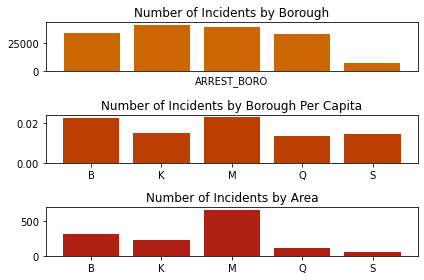

In [8]:
#fig, axs = plt.subplots(1,2)
fig, ax = plt.subplots(1, 3)
plt.subplot(311)
borough_group = nypd.groupby('ARREST_BORO')
borough_group.size().plot(kind='bar',color="#ca6702",xlabel=None,width=0.8,
                         title="Number of Incidents by Borough")
plt.xticks([])

plt.subplot(312)
lists = sorted(cases_per_capita.items()) # sorted by key, return a list of tuples
x, y = zip(*lists) # unpack a list of pairs into two tuples
plt.bar(x, y,color="#bb3e03")
plt.title('Number of Incidents by Borough Per Capita')

plt.subplot(313)
lists = sorted(cases_per_area.items()) # sorted by key, return a list of tuples
x, y = zip(*lists) # unpack a list of pairs into two tuples
plt.bar(x, y,color="#ae2012")
plt.title('Number of Incidents by Area')


fig.tight_layout()

### Incidents by Holiday

<AxesSubplot:title={'center':"Perpetrators' age"}, ylabel='Number of Cases'>

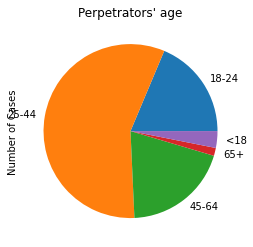

In [9]:
age_group = nypd.groupby('AGE_GROUP')
age_group.size().plot(kind='pie',title="Perpetrators' age",ylabel="Number of Cases")

National Holiday
<li> Friday, January 1 – New Year’s Day
<li>Monday, January 18 – Martin Luther King, Jr. Day
<li>Monday, February 15 – President’s Day
<li>Monday, May 31 – Memorial Day
<li>Friday, June 18 – Juneteenth (observed)
<li>Saturday, June 19 – Juneteenth
<li>Sunday, July 4 – Independence Day
<li>Monday, July 5 – Independence Day (observed)
<li>Monday, September 6 – Labor Day
<li>Monday, October 11 – Columbus Day
<li>Thursday, November 11 – Veterans Day
<li>Thursday, November 25 – Thanksgiving Day
<li>Friday, December 24 – Christmas Day (observed)
<li>Saturday, December 25 – Christmas Day
<li>Friday, December 31 – New Year’s Day (observed)

In [10]:
Federal_Holiday = ["01/01/2021","01/18/2021","02/15/2021","05/31/2021",
                   "06/18/2021","06/19/2021","07/04/2021","07/05/2021",
                   "09/06/2021","10/11/2021","11/11/2021","11/25/2021",
                   "12/24/2021","12/25/2021","12/31/2021"]

In [11]:
def holiday(a):
    if a in Federal_Holiday:
        return ("Holiday")
    else:
        return ("Non-Holiday")

In [12]:
nypd["if_holiday"]=nypd.apply(lambda x: holiday(x['ARREST_DATE']),axis=1)

In [13]:
holiday = {
    "Non-Holiday":350, #when it is not a holiday
    "Holiday":15 #when it is a holiday
}
cases_for_holiday={}
for i in holiday:
    cases_for_holiday[i]=nypd.groupby('if_holiday').size()[i]/holiday[i]

In [14]:
cases_for_holiday

{'Non-Holiday': 425.72857142857146, 'Holiday': 333.73333333333335}

Text(0.5, 1.0, 'Number of Incidents by Holiday')

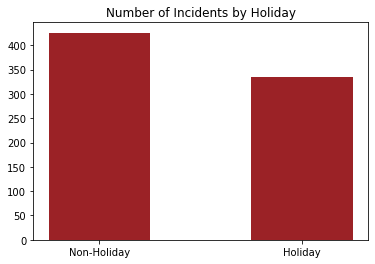

In [15]:
plt.bar(*zip(*cases_for_holiday.items()),color="#9b2226",width=0.5)
plt.title('Number of Incidents by Holiday')

In [16]:
import folium #maping crime on the map
from folium.plugins import HeatMap, MarkerCluster #making maping visually appealing
import json
from shapely.geometry import Point

In [17]:
df_point=nypd[['Latitude','Longitude']]

In [18]:
df_point.values

array([[ 40.72618713, -73.7352339 ],
       [ 40.63686751, -73.89158592],
       [ 40.59414517, -73.96041495],
       ...,
       [ 40.62322682, -74.14922697],
       [ 40.6841943 , -73.91608475],
       [ 40.69022557, -73.82993154]])

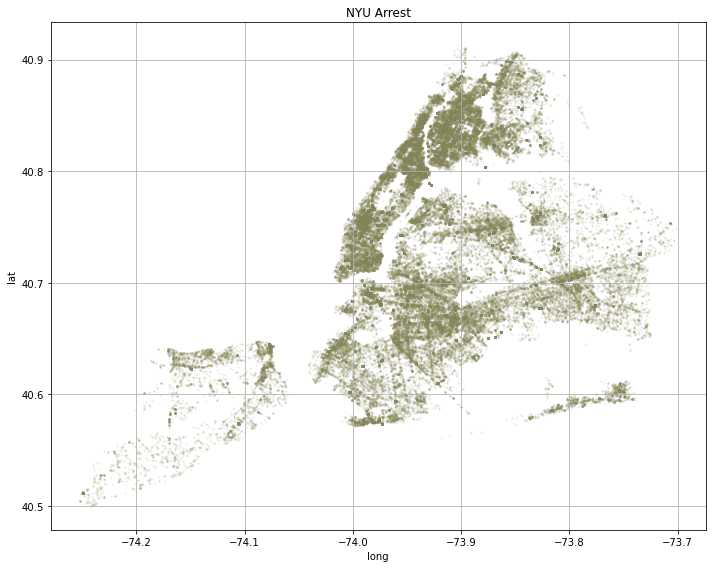

In [51]:
plt.figure(num=None, figsize=(10, 8))
plt.scatter("Longitude", "Latitude", data = df_point, c = 'y',alpha = 0.1, edgecolor = 'gray', s=2)
plt.grid()
plt.xlabel('long')
plt.ylabel('lat')
plt.title('NYU Arrest')
plt.tight_layout()
plt.axis('tight')

plt.show()

In [49]:
m = folium.Map(location=[40.7226,-74.00805],zoom_start=8)

cluster = MarkerCluster().add_to(m)

heat = HeatMap(df_point.values,
                 min_opacity=1,
                 radius=1, blur=1, 
                 max_zoom=5,fill_color='RdYlGn')

heat.add_to(m)

In [50]:
m

In [22]:
count_by_precinct=pd.DataFrame({'count': nypd.groupby( ["ARREST_PRECINCT"] ).size()}).reset_index()
count_by_precinct["ARREST_PRECINCT"]=count_by_precinct["ARREST_PRECINCT"].apply(str)
count_by_precinct.columns=['precinct','count']
count_by_precinct

,precinct,count
0,1,1729
1,5,2195
2,6,1429
3,7,1612
4,9,1664
...,...,...
72,115,2498
73,120,2891
74,121,2170
75,122,1337


In [26]:
with open('nyc-police-precincts.geojson') as data_file:
    data = json.load(data_file)
#data

In [42]:
import folium
#Center the map at Times Square
m = folium.Map(location = [40.7589,-73.9851],zoom_start=10)

m.choropleth(geo_data='nyc-police-precincts.geojson', data=count_by_precinct,
             columns=['precinct','count'],
             key_on='feature.properties.precinct',
             fill_color='OrRd', fill_opacity=0.7, line_opacity=0.8,
             legend_name='Distribution of Incidents')
folium.LayerControl().add_to(m)

In [43]:
m